In [132]:
import numpy as np
import pandas as pd
from functools import partial
from IPython.display import HTML, display
from colorcet import fire
import datashader as ds
import dask.dataframe as dd
from bokeh.io import output_notebook
from bokeh.plotting import figure, output_notebook, show
from datashader.bokeh_ext import InteractiveImage
from datashader import transfer_functions as tf
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno

import geoviews as gv
import cartopy.crs as ccrs
import holoviews as hv
from holoviews.operation.datashader import aggregate, datashade

import warnings
warnings.filterwarnings('ignore')

# NYPD Motor Vehicle Collisions

Using motor vehicle collission data from https://data.cityofnewyork.us/Public-Safety/NYPD-Motor-Vehicle-Collisions/h9gi-nx95

This is a breakdown of every collision in NYC by location and injury. This data is collected because the NYC Council passed Local Law #11 in 2011. This data is manually run every month and reviewed by the TrafficStat Unit before being posted on the NYPD website. Each record represents a collision in NYC by city, borough, precinct and cross street. This data can be used by the public to see how dangerous/safe intersections are in NYC.

In [2]:
df = pd.read_csv('data/NYPD_Motor_Vehicle_Collisions.csv')
df = df[df.LATITUDE > 40.5011072]
df = df[df.LATITUDE < 40.9122231]
df = df[df.LONGITUDE > -74.2482769]
df = df[df.LONGITUDE < -73.700584]

df.head()

,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,01/16/2018,0:00,BRONX,10451,40.816900,-73.920920,"(40.8169, -73.92092)",NaN,NaN,316 EAST 149 STREET,...,Driver Inattention/Distraction,NaN,NaN,NaN,3831031,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
1,01/16/2018,0:00,BRONX,10452,40.840977,-73.916016,"(40.840977, -73.916016)",EAST 171 STREET,TOWNSEND AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,3829954,SPORT UTILITY / STATION WAGON,PASSENGER VEHICLE,NaN,NaN,NaN
2,01/16/2018,0:00,BRONX,10452,40.842750,-73.924774,"(40.84275, -73.924774)",WEST 171 STREET,MERRIAM AVENUE,NaN,...,NaN,NaN,NaN,NaN,3830416,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN,NaN
3,01/16/2018,0:00,BRONX,10454,40.807530,-73.909170,"(40.80753, -73.90917)",NaN,NaN,359 WALES AVENUE,...,NaN,NaN,NaN,NaN,3830043,PASSENGER VEHICLE,NaN,NaN,NaN,NaN
4,01/16/2018,0:00,BROOKLYN,11237,40.704280,-73.915720,"(40.70428, -73.91572)",NaN,NaN,413 HIMROD STREET,...,NaN,NaN,NaN,NaN,3830314,SPORT UTILITY / STATION WAGON,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN


In [3]:
df.columns

Index(['DATE', 'TIME', 'BOROUGH', 'ZIP CODE', 'LATITUDE', 'LONGITUDE',
       'LOCATION', 'ON STREET NAME', 'CROSS STREET NAME', 'OFF STREET NAME',
       'NUMBER OF PERSONS INJURED', 'NUMBER OF PERSONS KILLED',
       'NUMBER OF PEDESTRIANS INJURED', 'NUMBER OF PEDESTRIANS KILLED',
       'NUMBER OF CYCLIST INJURED', 'NUMBER OF CYCLIST KILLED',
       'NUMBER OF MOTORIST INJURED', 'NUMBER OF MOTORIST KILLED',
       'CONTRIBUTING FACTOR VEHICLE 1', 'CONTRIBUTING FACTOR VEHICLE 2',
       'CONTRIBUTING FACTOR VEHICLE 3', 'CONTRIBUTING FACTOR VEHICLE 4',
       'CONTRIBUTING FACTOR VEHICLE 5', 'UNIQUE KEY', 'VEHICLE TYPE CODE 1',
       'VEHICLE TYPE CODE 2', 'VEHICLE TYPE CODE 3', 'VEHICLE TYPE CODE 4',
       'VEHICLE TYPE CODE 5'],
      dtype='object')

In [4]:
df[['NUMBER OF PERSONS INJURED', 'NUMBER OF PERSONS KILLED',
       'NUMBER OF PEDESTRIANS INJURED', 'NUMBER OF PEDESTRIANS KILLED',
       'NUMBER OF CYCLIST INJURED', 'NUMBER OF CYCLIST KILLED',
       'NUMBER OF MOTORIST INJURED', 'NUMBER OF MOTORIST KILLED']].sum()

NUMBER OF PERSONS INJURED        251489
NUMBER OF PERSONS KILLED           1132
NUMBER OF PEDESTRIANS INJURED     53630
NUMBER OF PEDESTRIANS KILLED        623
NUMBER OF CYCLIST INJURED         20630
NUMBER OF CYCLIST KILLED             81
NUMBER OF MOTORIST INJURED       177919
NUMBER OF MOTORIST KILLED           431
dtype: int64

### Visualize all incidents

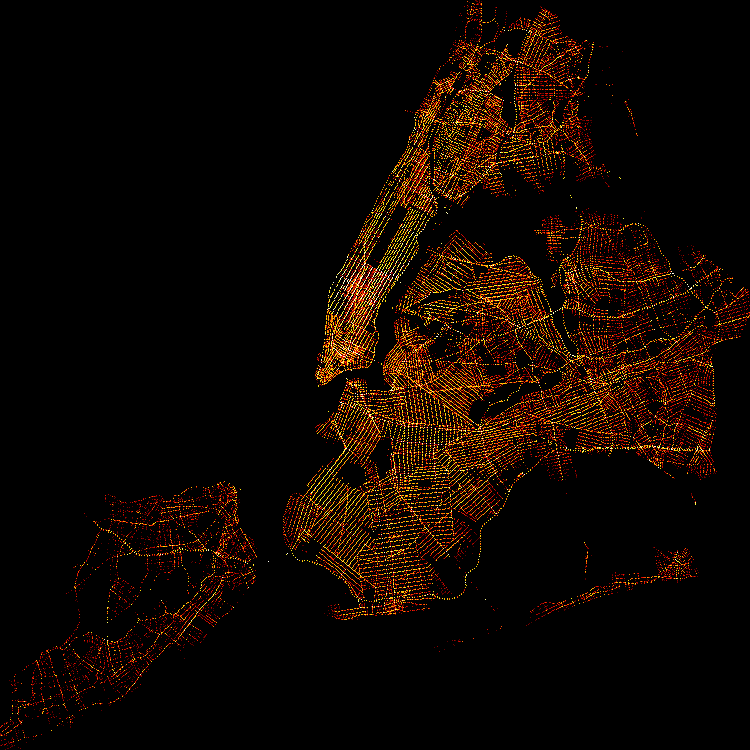

In [5]:
agg = ds.Canvas(750,750).points(df, 'LONGITUDE','LATITUDE')
tf.set_background(tf.shade(agg, cmap=fire),"black")

### Contributing factors

In [6]:
def df_factor(factor):
    return df[(df['CONTRIBUTING FACTOR VEHICLE 1']==factor) | \
       (df['CONTRIBUTING FACTOR VEHICLE 2']==factor) | \
       (df['CONTRIBUTING FACTOR VEHICLE 3']==factor) | \
       (df['CONTRIBUTING FACTOR VEHICLE 4']==factor) | \
       (df['CONTRIBUTING FACTOR VEHICLE 5']==factor) ]

def df_vehicle(vehicle_type):
    return df[(df['VEHICLE TYPE CODE 1']==vehicle_type) | \
       (df['VEHICLE TYPE CODE 2']==vehicle_type) | \
       (df['VEHICLE TYPE CODE 3']==vehicle_type) | \
       (df['VEHICLE TYPE CODE 4']==vehicle_type) | \
       (df['VEHICLE TYPE CODE 5']==vehicle_type) ]

In [7]:
contributing_factors = set()

for column in df.columns:
    if column.startswith('CONTRIBUTING FACTOR'):
        contributing_factors.update(list(df[column].unique()))

In [8]:
contributing_factors

{'Accelerator Defective',
 'Aggressive Driving/Road Rage',
 'Alcohol Involvement',
 'Animals Action',
 'Backing Unsafely',
 'Brakes Defective',
 'Cell Phone (hand-held)',
 'Cell Phone (hands-free)',
 'Driver Inattention/Distraction',
 'Driver Inexperience',
 'Driverless/Runaway Vehicle',
 'Drugs (Illegal)',
 'Failure to Keep Right',
 'Failure to Yield Right-of-Way',
 'Fatigued/Drowsy',
 'Fell Asleep',
 'Following Too Closely',
 'Glare',
 'Headlights Defective',
 'Illness',
 'Lane Marking Improper/Inadequate',
 'Lost Consciousness',
 'Obstruction/Debris',
 'Other Electronic Device',
 'Other Lighting Defects',
 'Other Vehicular',
 'Outside Car Distraction',
 'Oversized Vehicle',
 'Passenger Distraction',
 'Passing or Lane Usage Improper',
 'Pavement Defective',
 'Pavement Slippery',
 'Pedestrian/Bicyclist/Other Pedestrian Error/Confusion',
 'Physical Disability',
 'Prescription Medication',
 'Reaction to Other Uninvolved Vehicle',
 'Shoulders Defective/Improper',
 'Steering Failure',
 'T

In [9]:
contributing_factors.remove(np.nan)

Other Lighting Defects : 84 incidents,


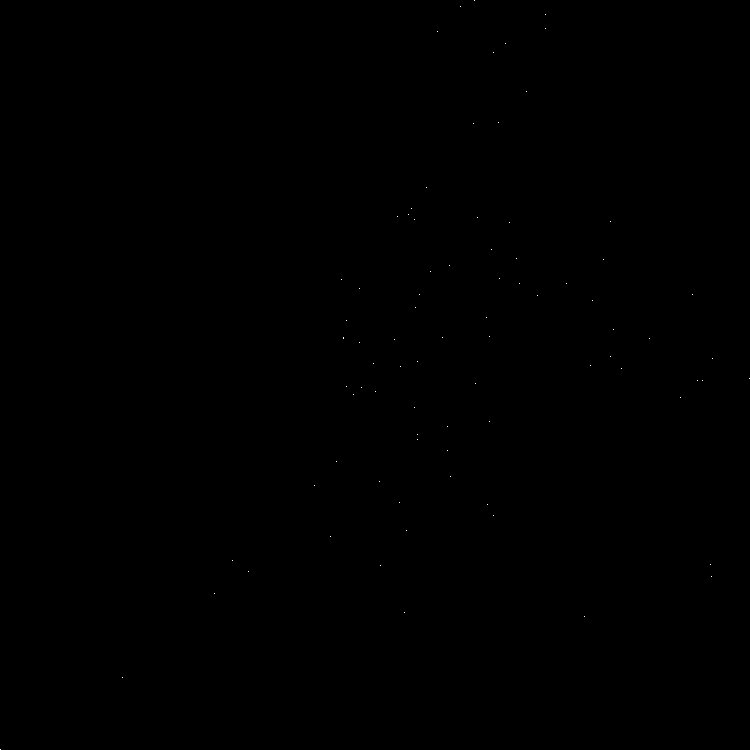

View Obstructed/Limited : 5278 incidents,


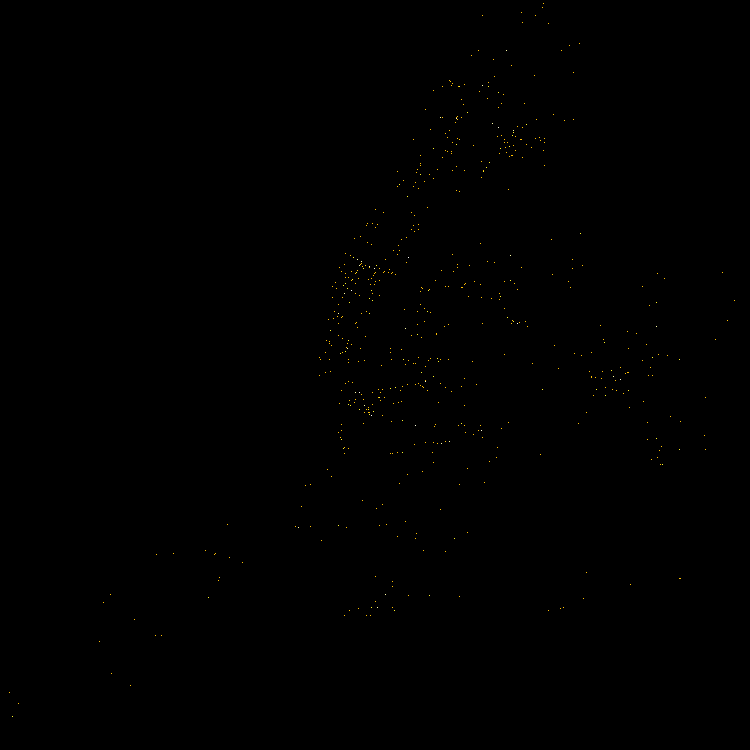

Oversized Vehicle : 6804 incidents,


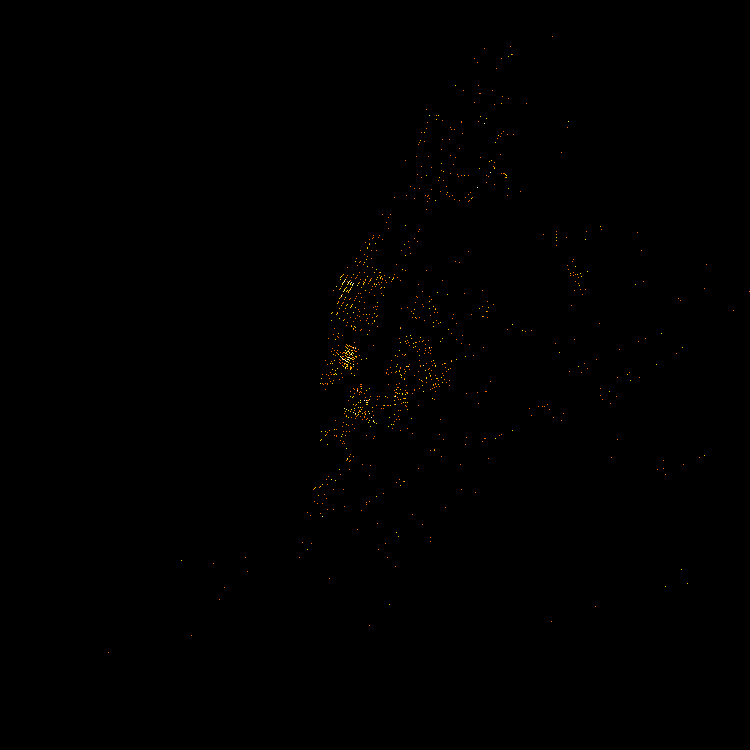

Steering Failure : 993 incidents,


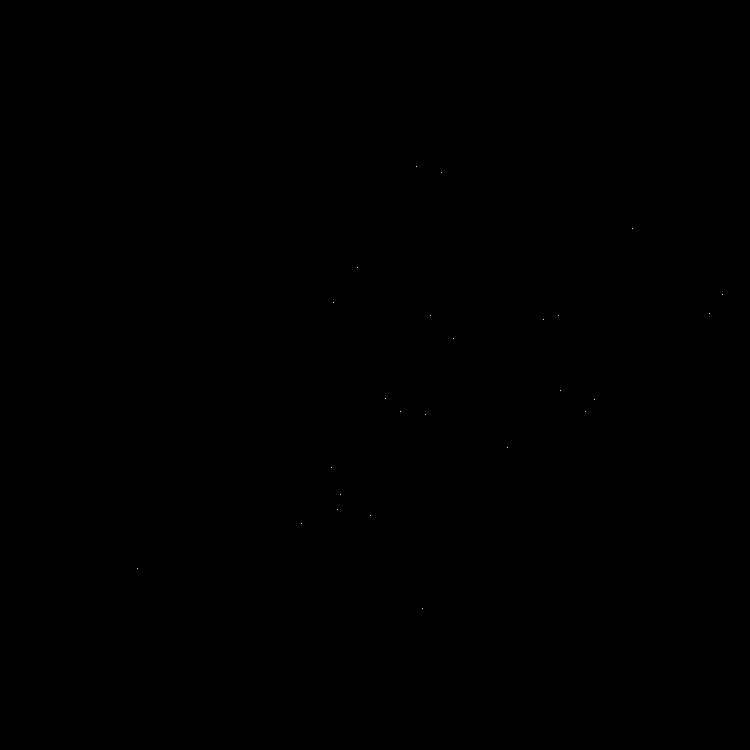

Headlights Defective : 79 incidents,


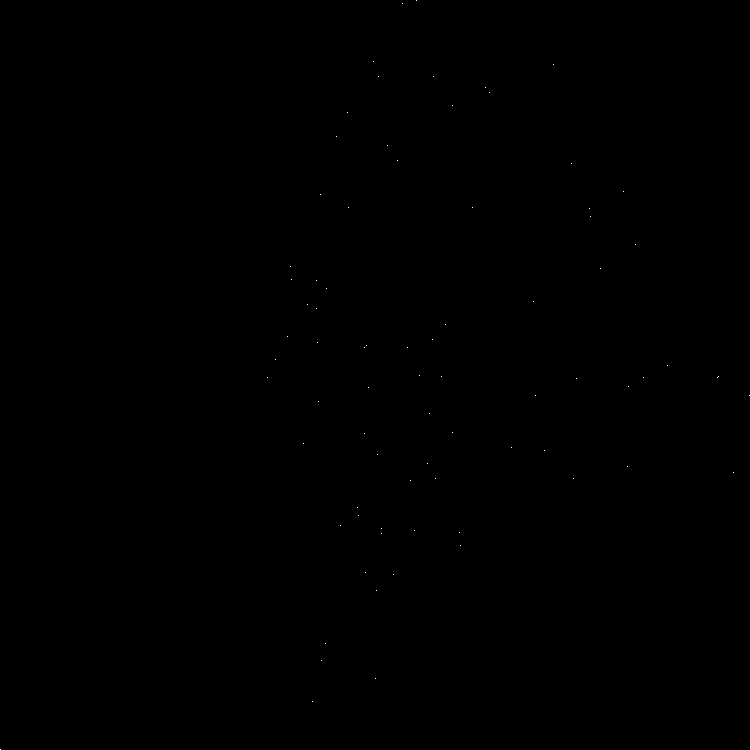

Tire Failure/Inadequate : 951 incidents,


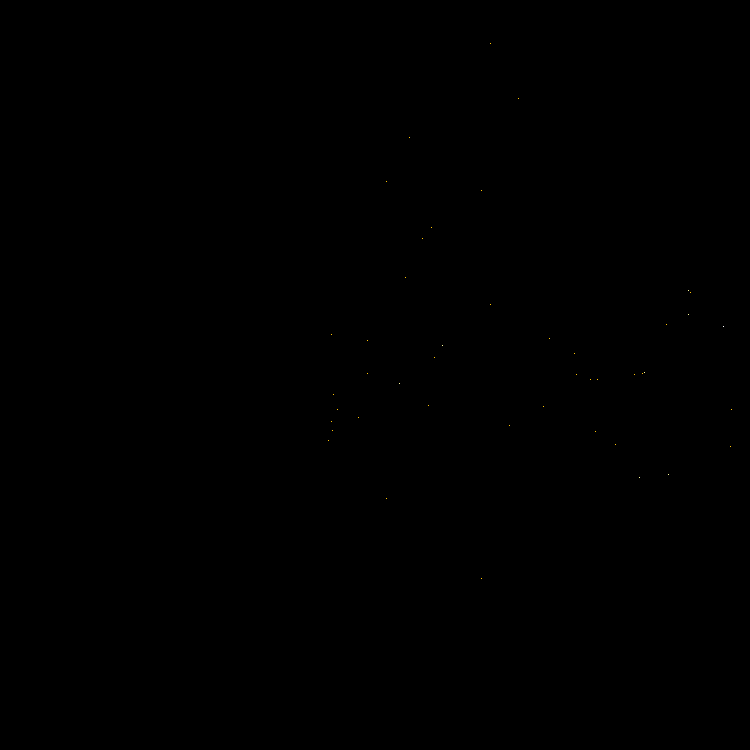

Alcohol Involvement : 8874 incidents,


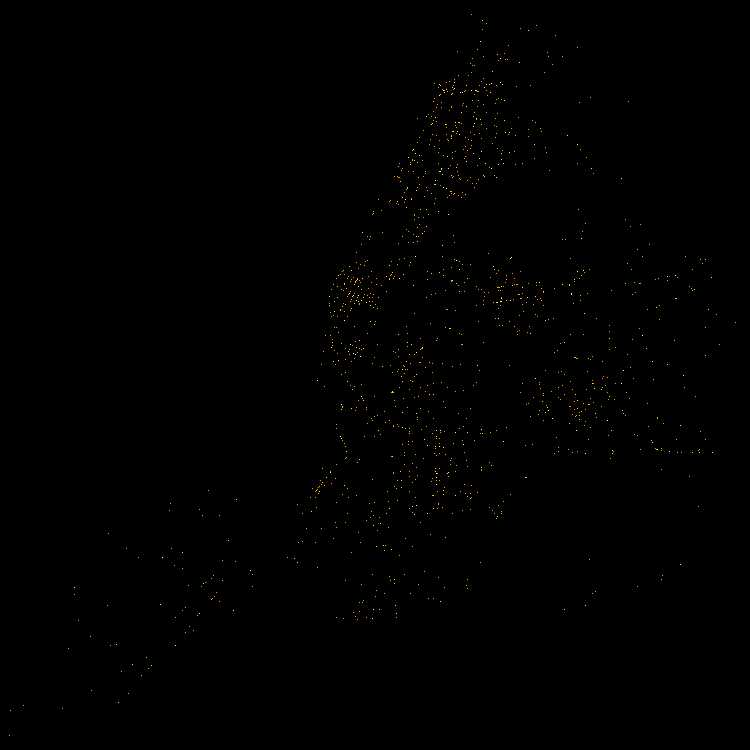

Fatigued/Drowsy : 43678 incidents,


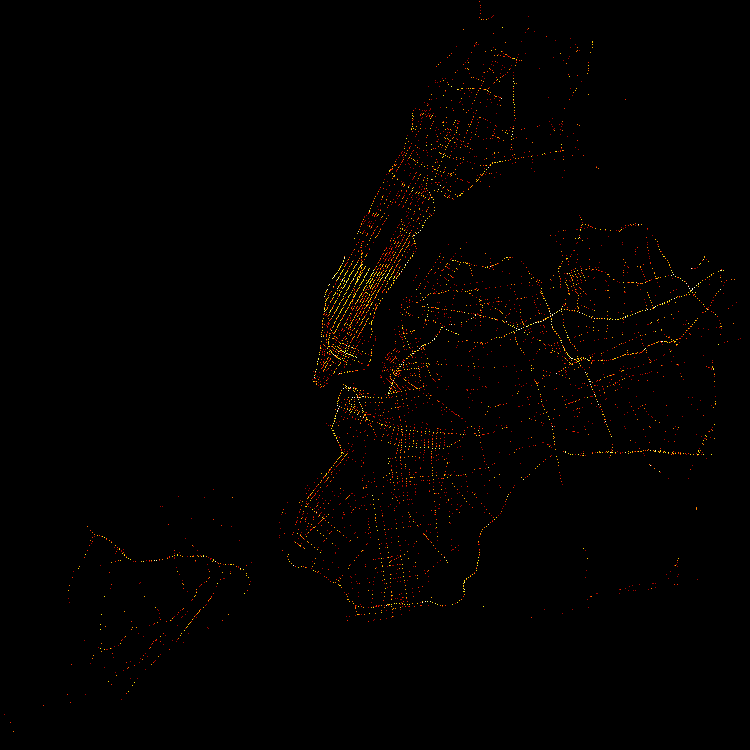

Driver Inexperience : 15087 incidents,


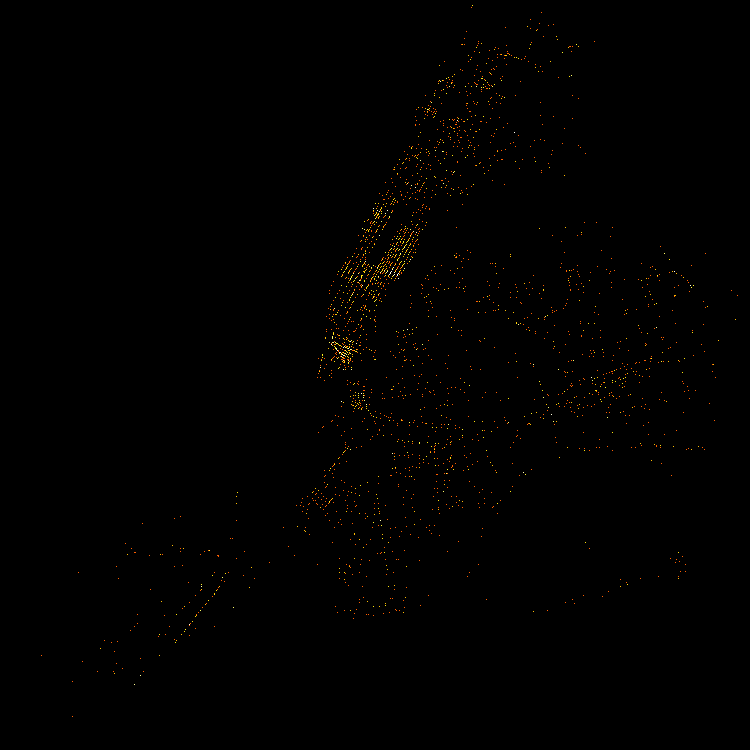

Shoulders Defective/Improper : 46 incidents,


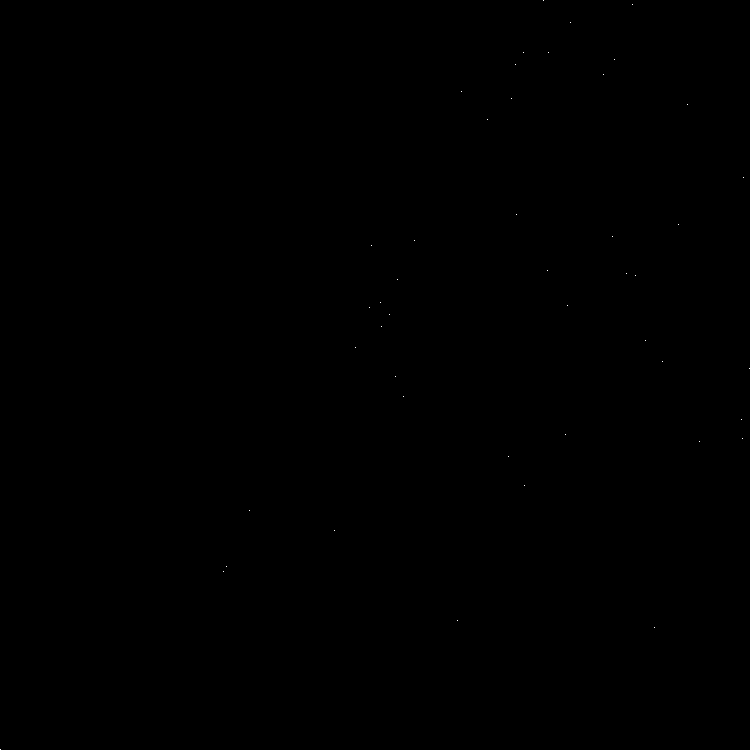

Pavement Defective : 1091 incidents,


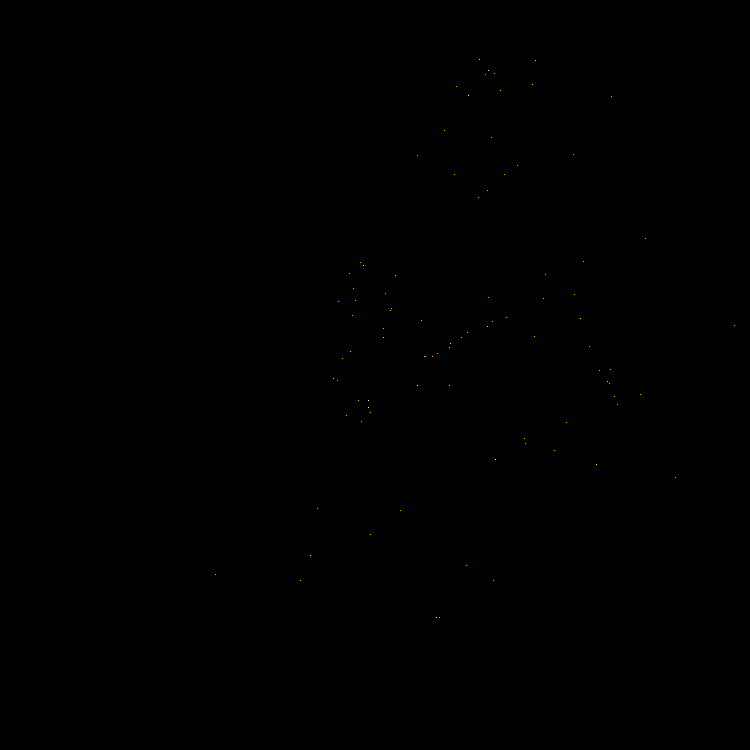

Driverless/Runaway Vehicle : 322 incidents,


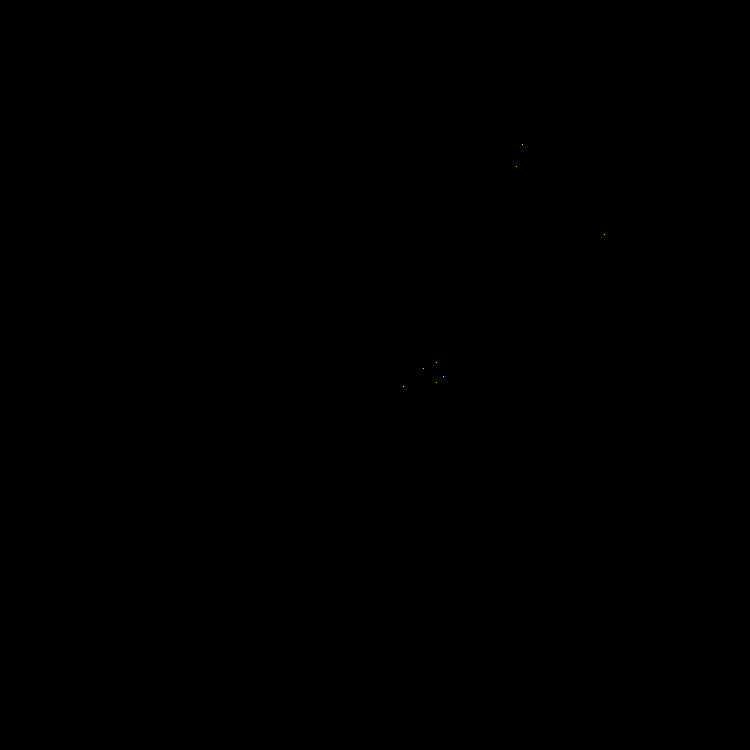

Lane Marking Improper/Inadequate : 490 incidents,


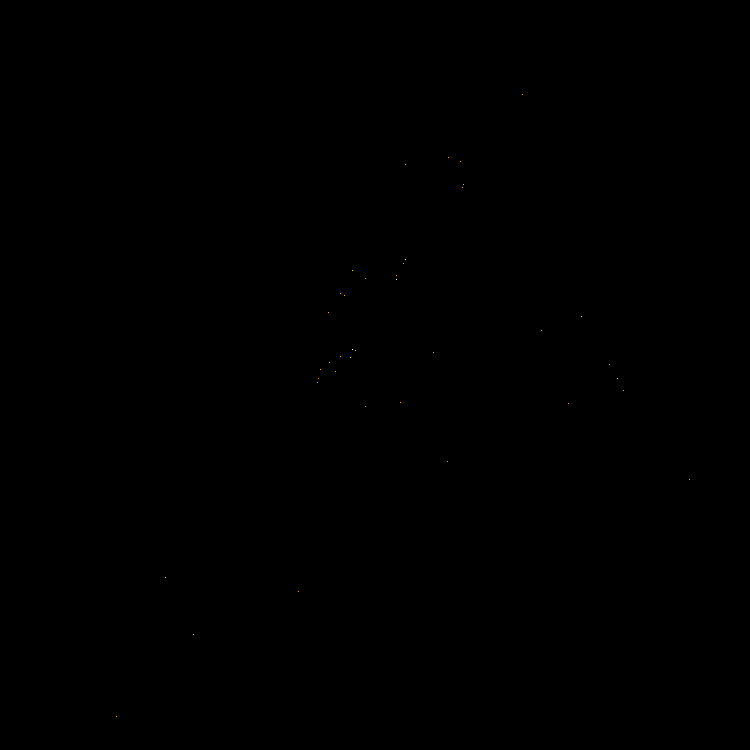

Traffic Control Disregarded : 15436 incidents,


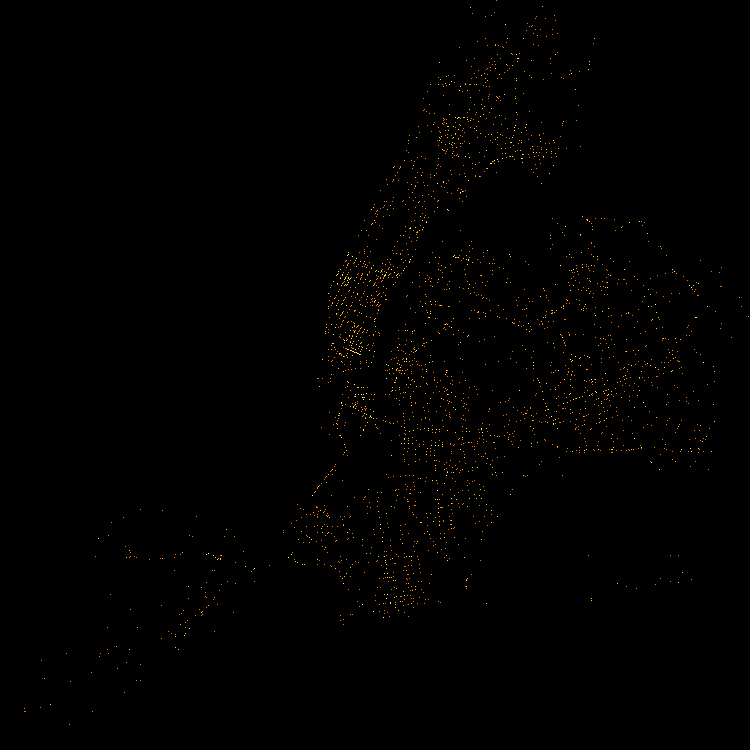

Traffic Control Device Improper/Non-Working : 445 incidents,


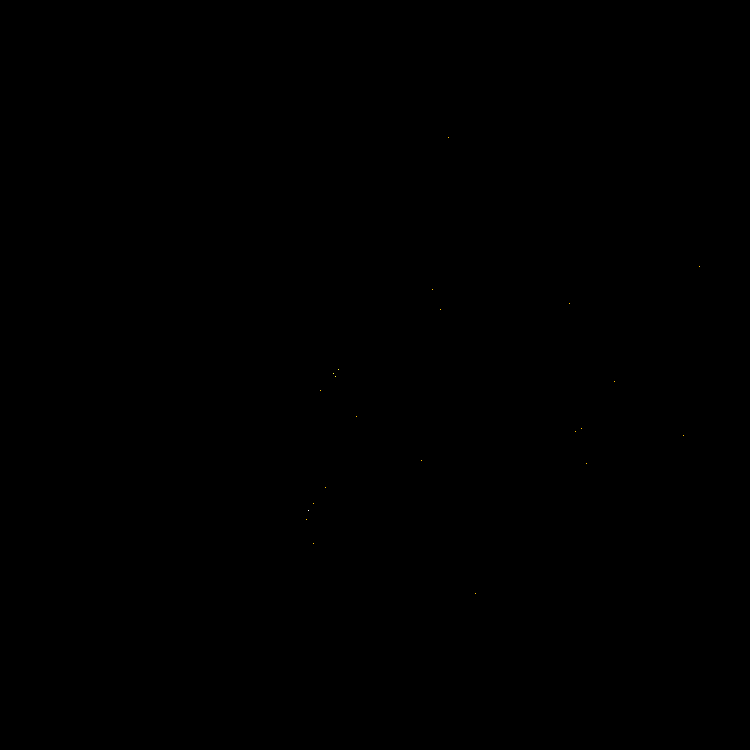

Passenger Distraction : 5406 incidents,


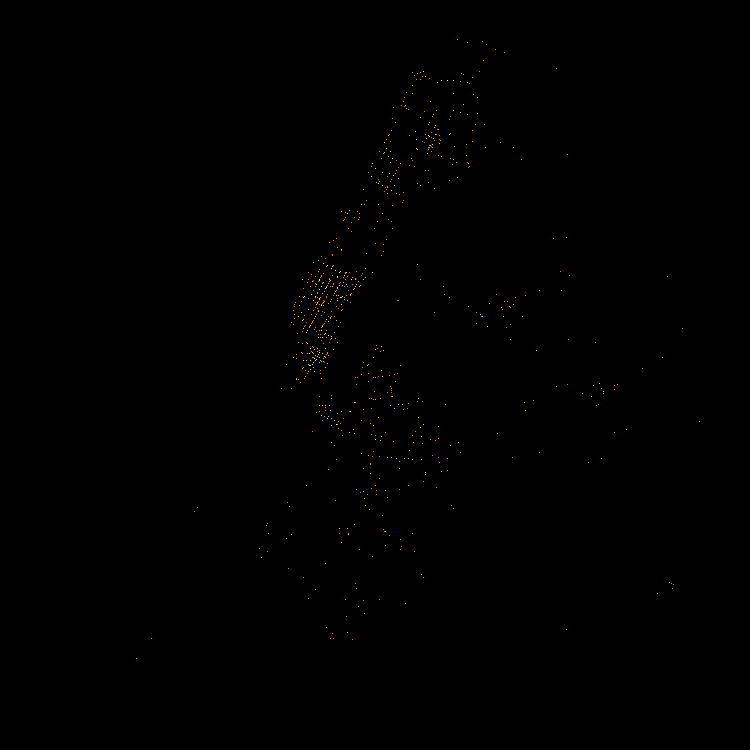

Animals Action : 599 incidents,


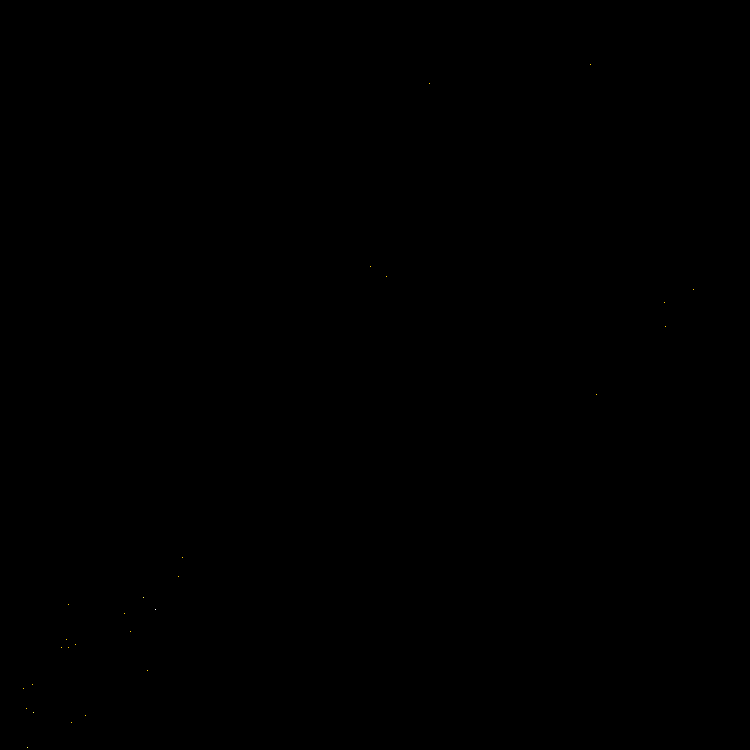

Tow Hitch Defective : 100 incidents,


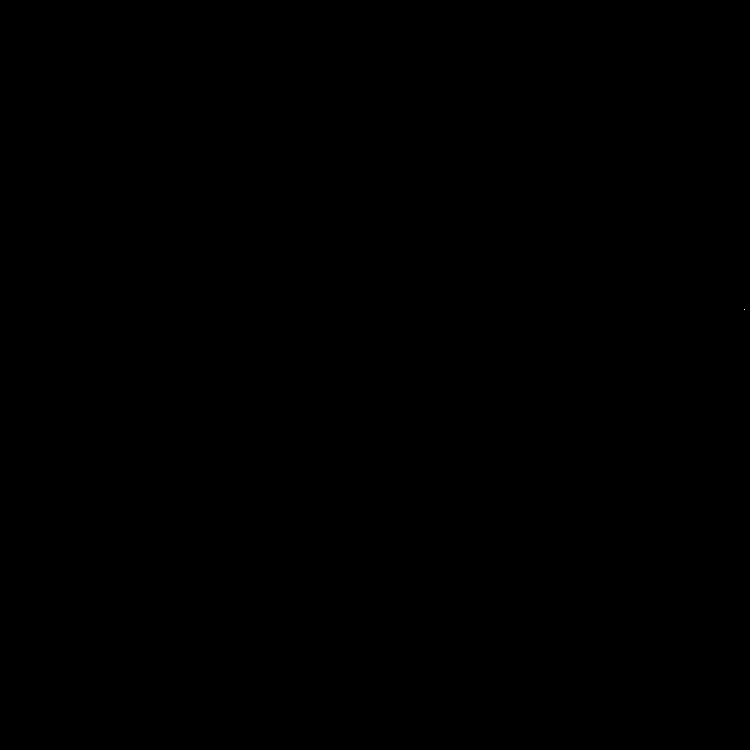

Reaction to Other Uninvolved Vehicle : 6332 incidents,


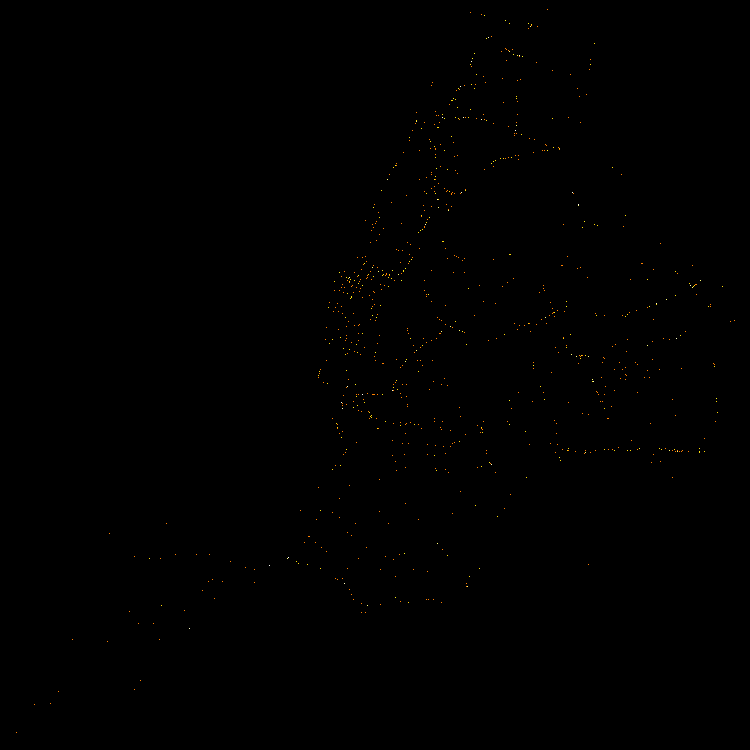

Cell Phone (hand-held) : 197 incidents,


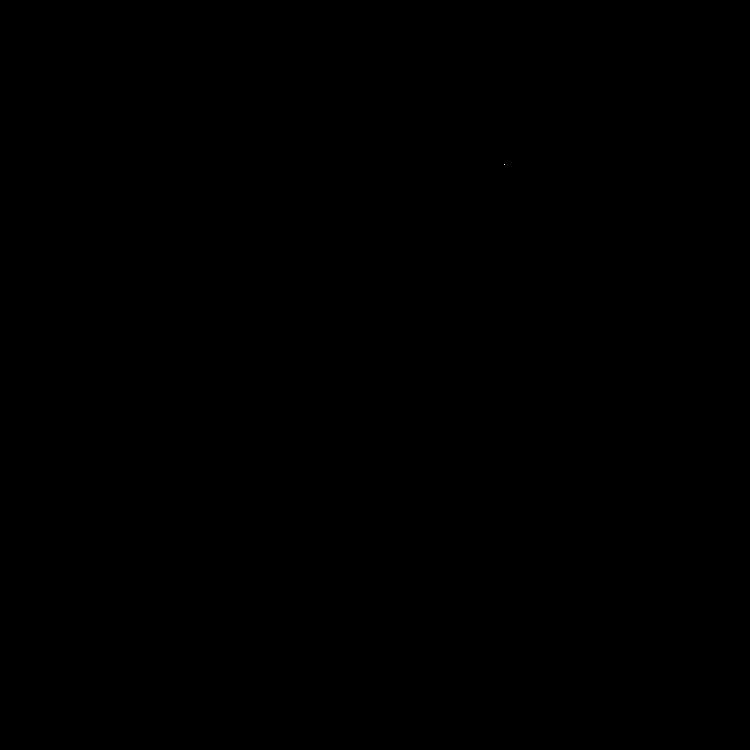

Turning Improperly : 26373 incidents,


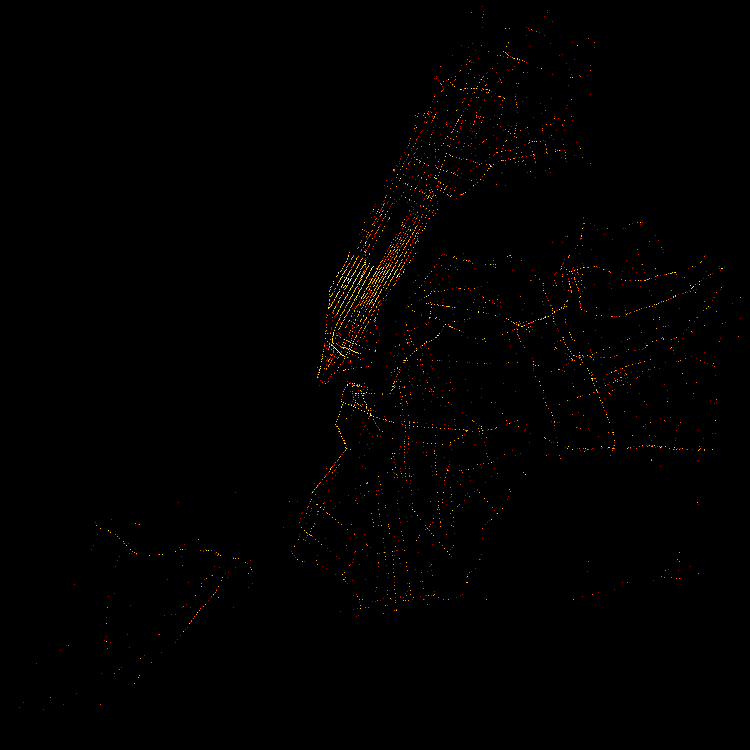

Cell Phone (hands-free) : 206 incidents,


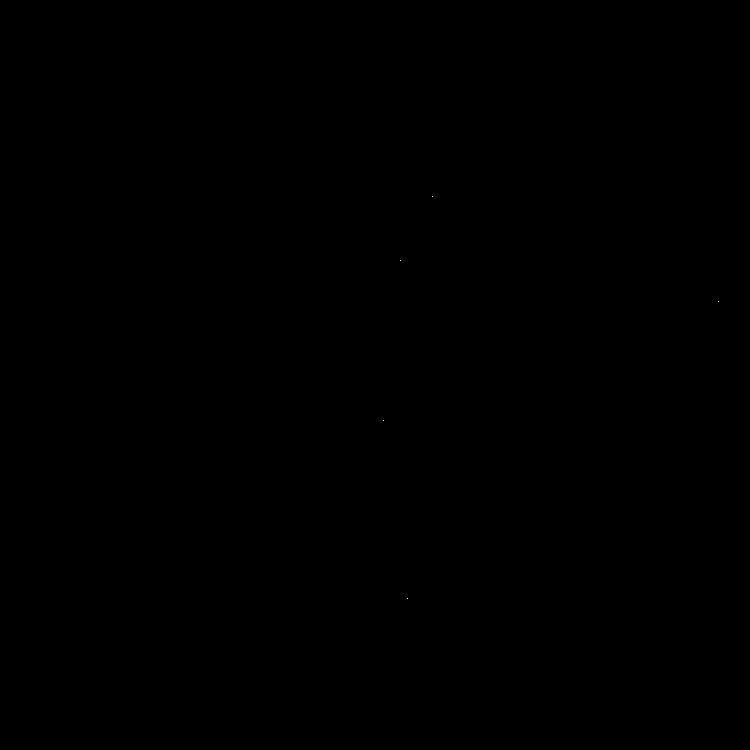

Windshield Inadequate : 50 incidents,


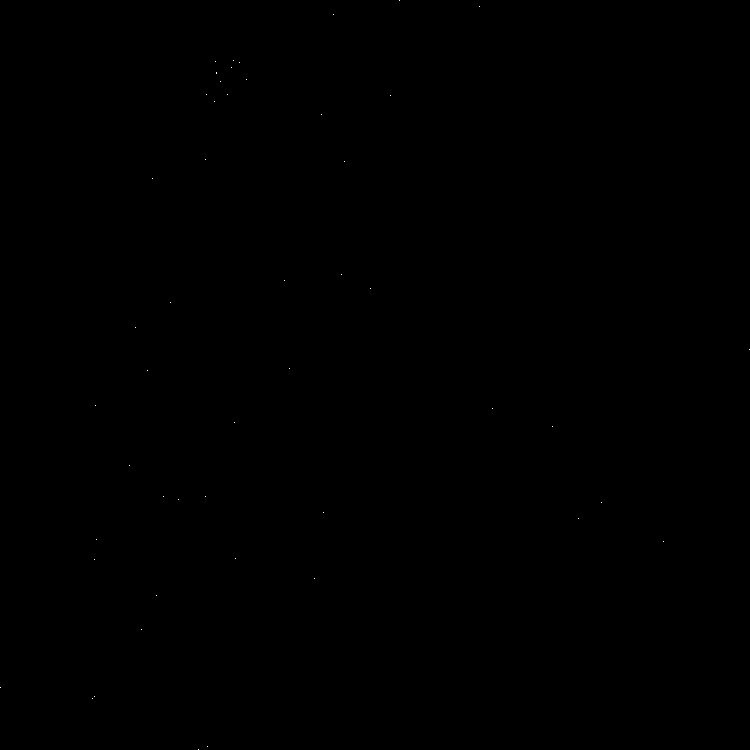

Brakes Defective : 2729 incidents,


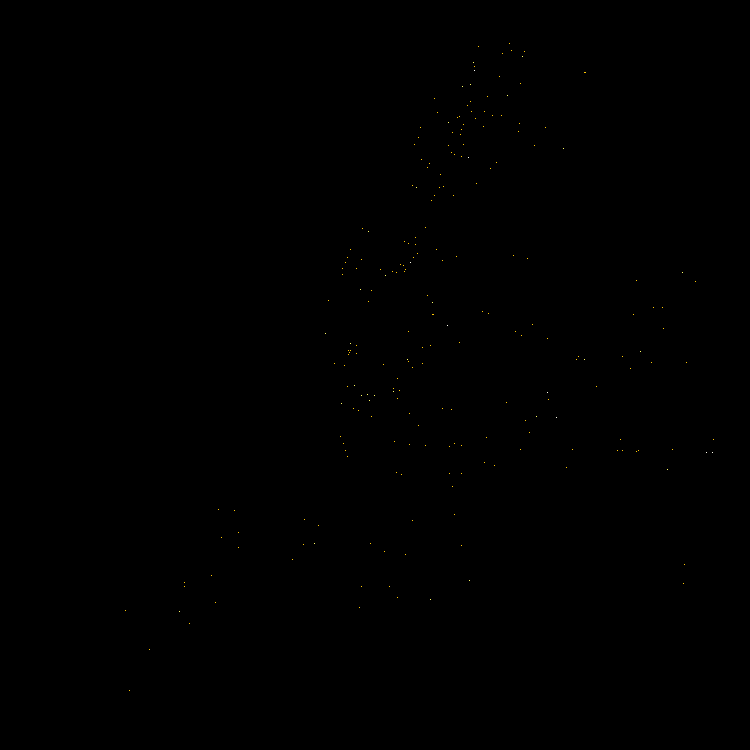

Glare : 2120 incidents,


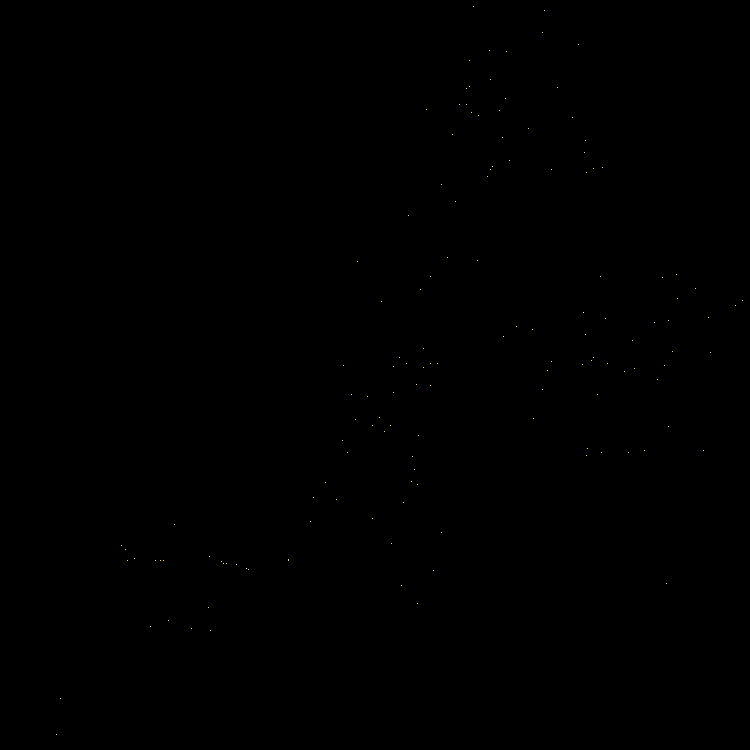

Fell Asleep : 1958 incidents,


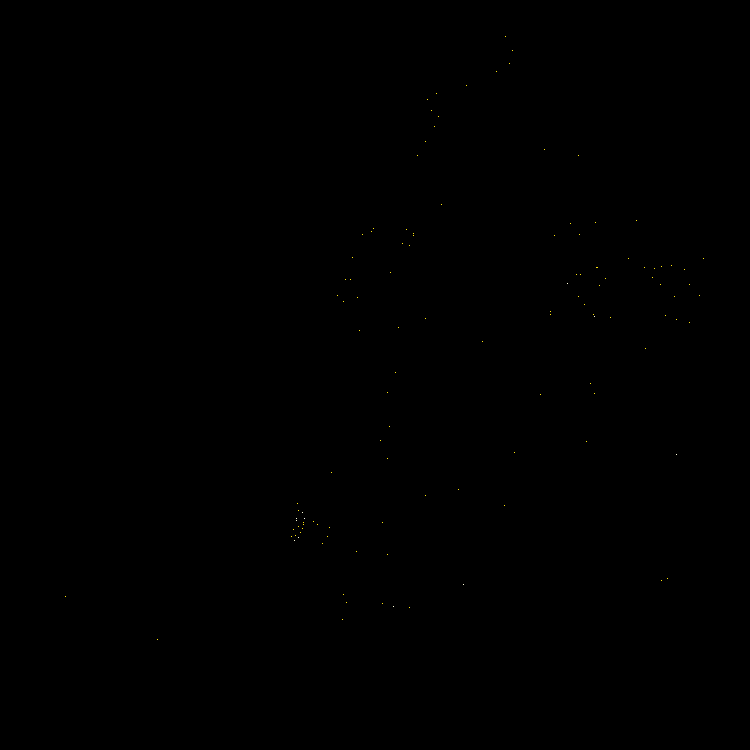

Unspecified : 802641 incidents,


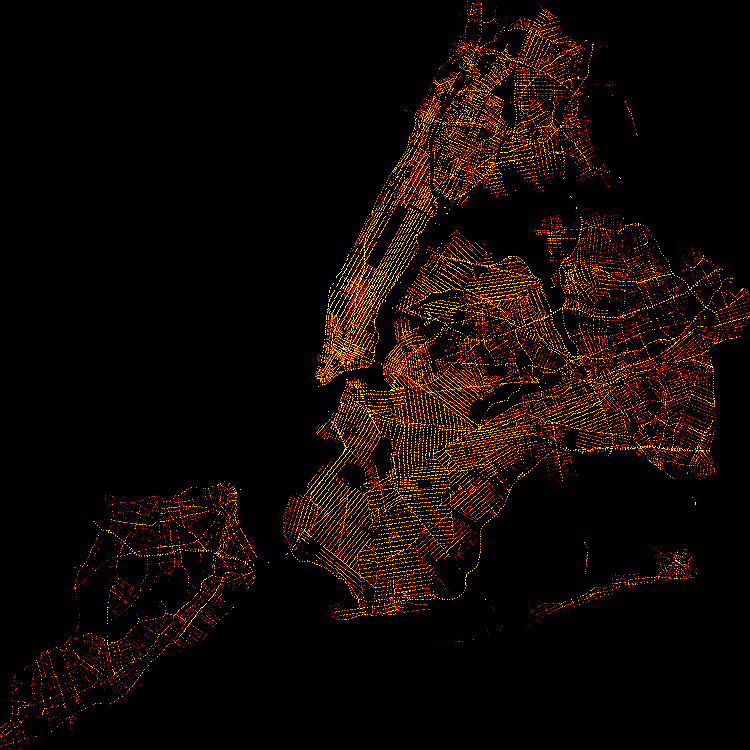

Failure to Yield Right-of-Way : 53453 incidents,


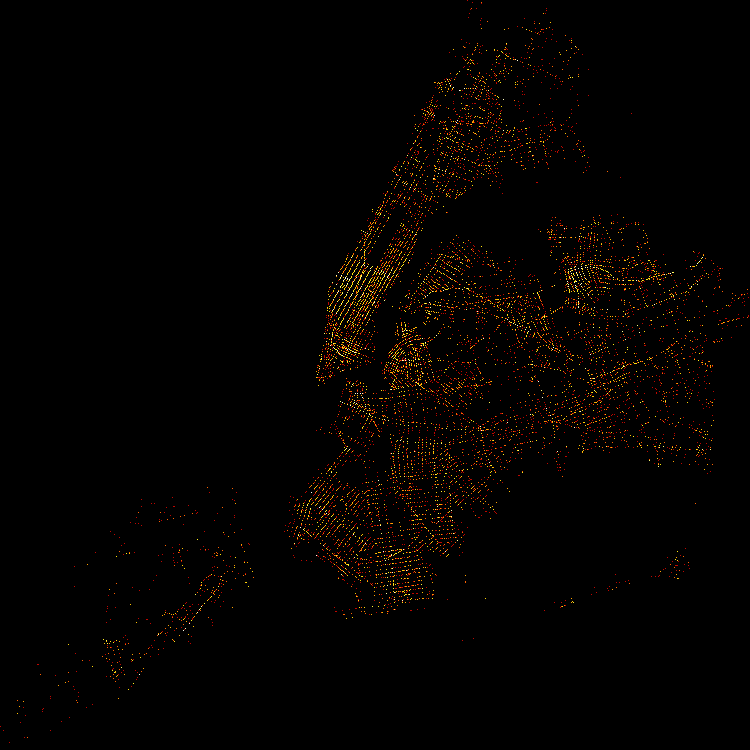

Lost Consciousness : 19205 incidents,


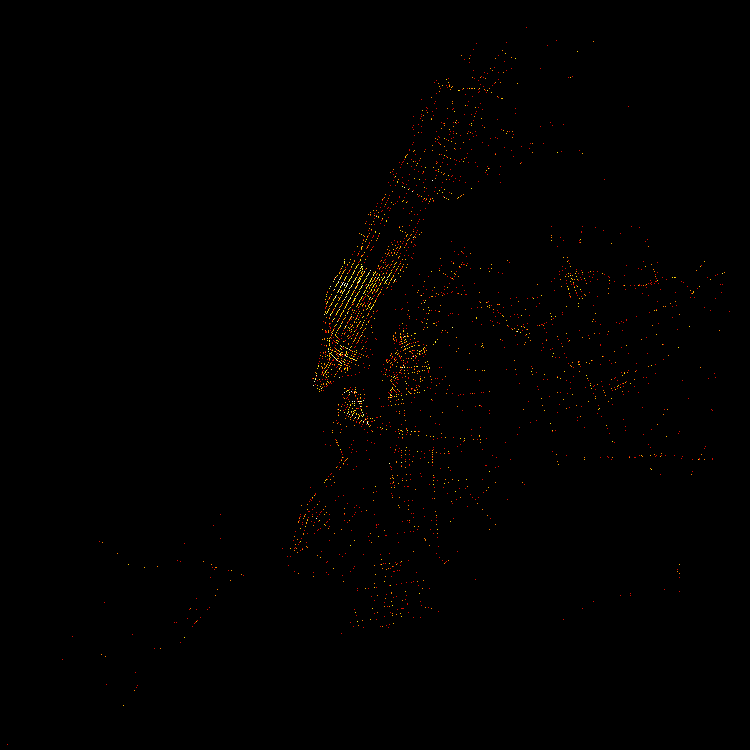

Aggressive Driving/Road Rage : 3717 incidents,


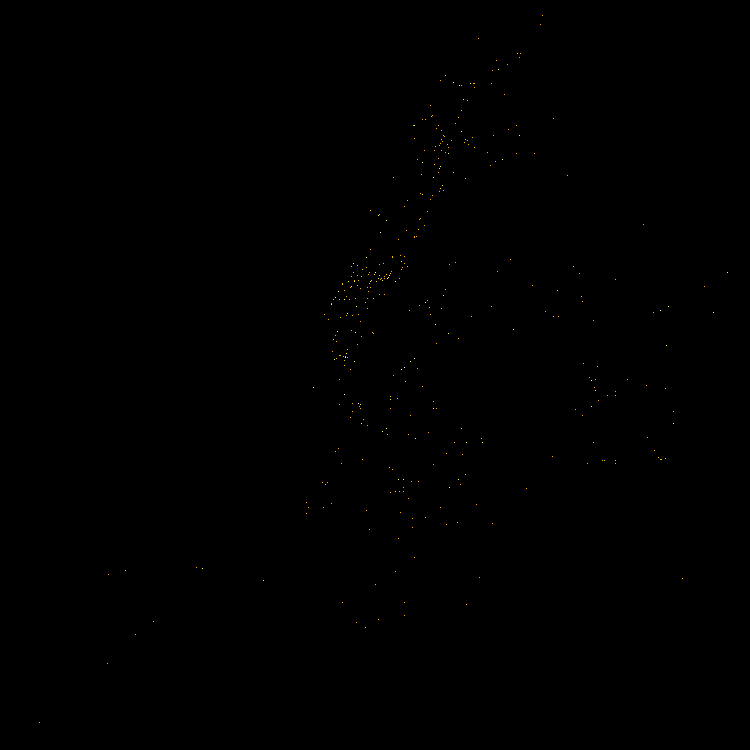

Driver Inattention/Distraction : 155266 incidents,


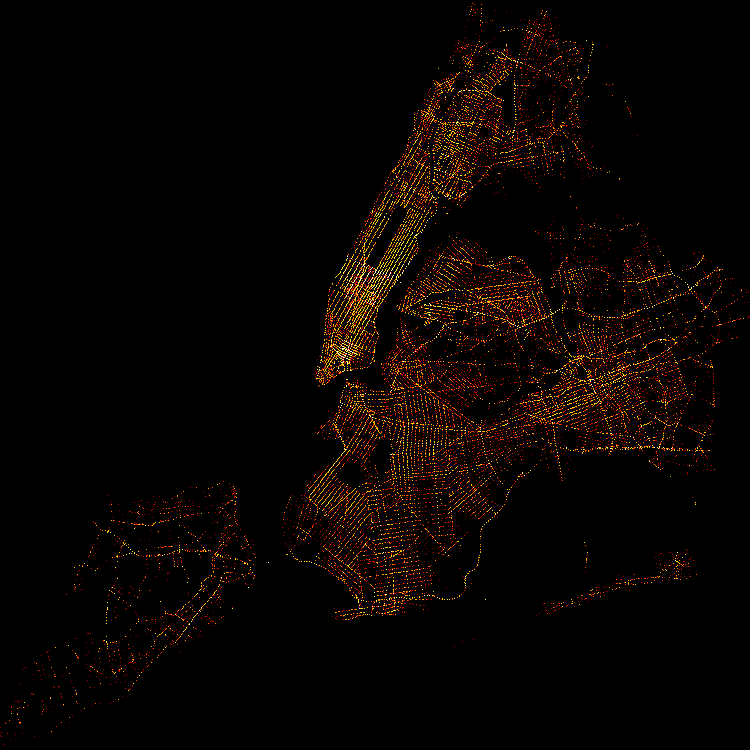

Pedestrian/Bicyclist/Other Pedestrian Error/Confusion : 2103 incidents,


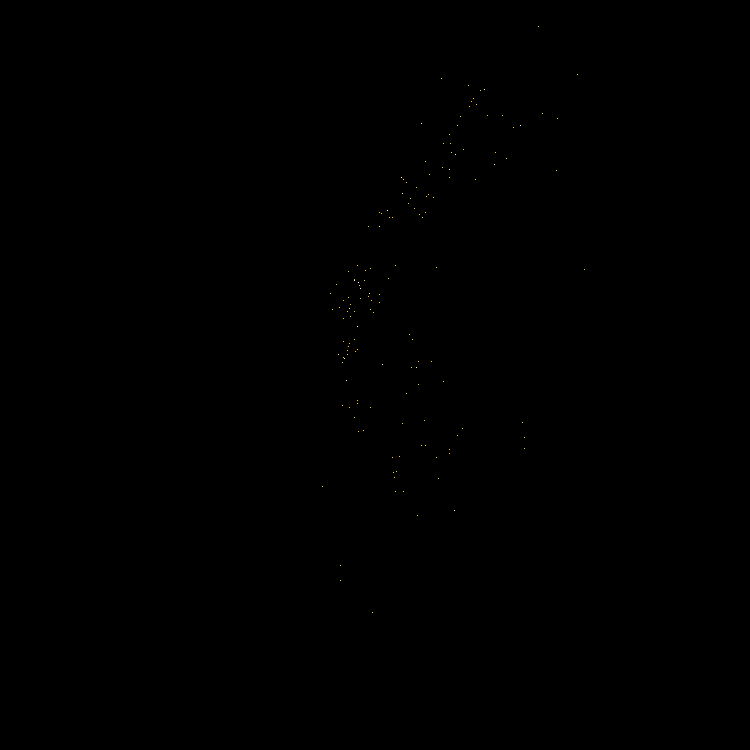

Following Too Closely : 28756 incidents,


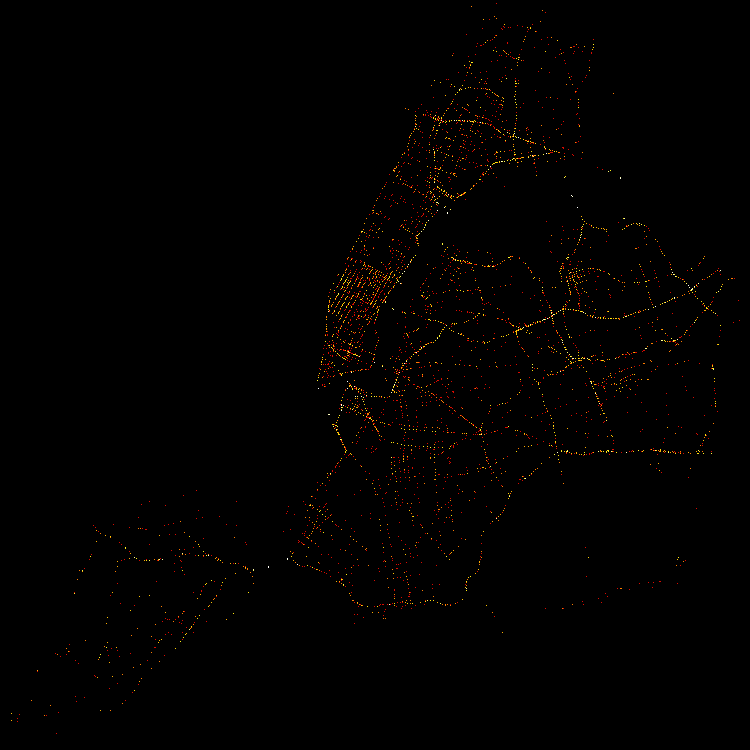

Unsafe Speed : 5818 incidents,


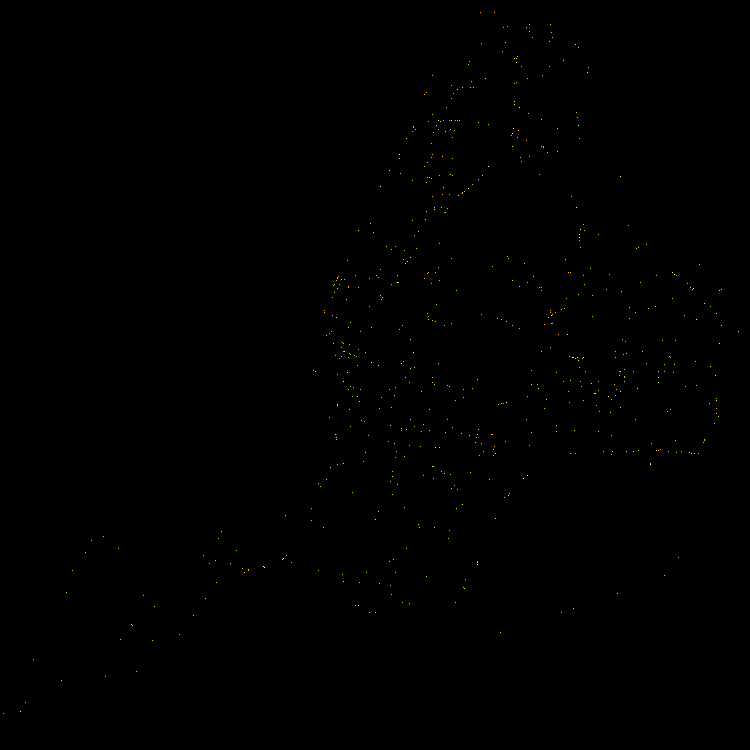

Pavement Slippery : 10789 incidents,


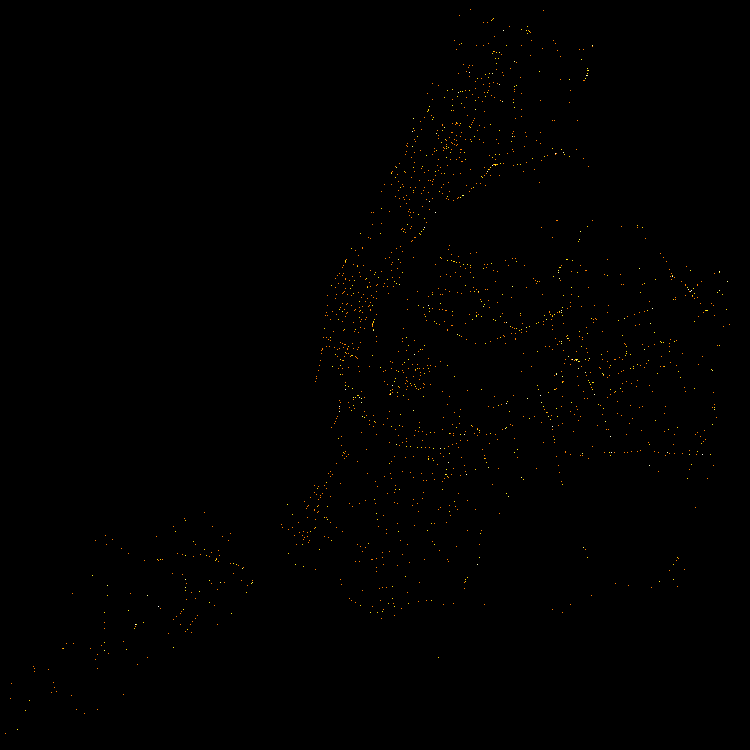

Physical Disability : 8859 incidents,


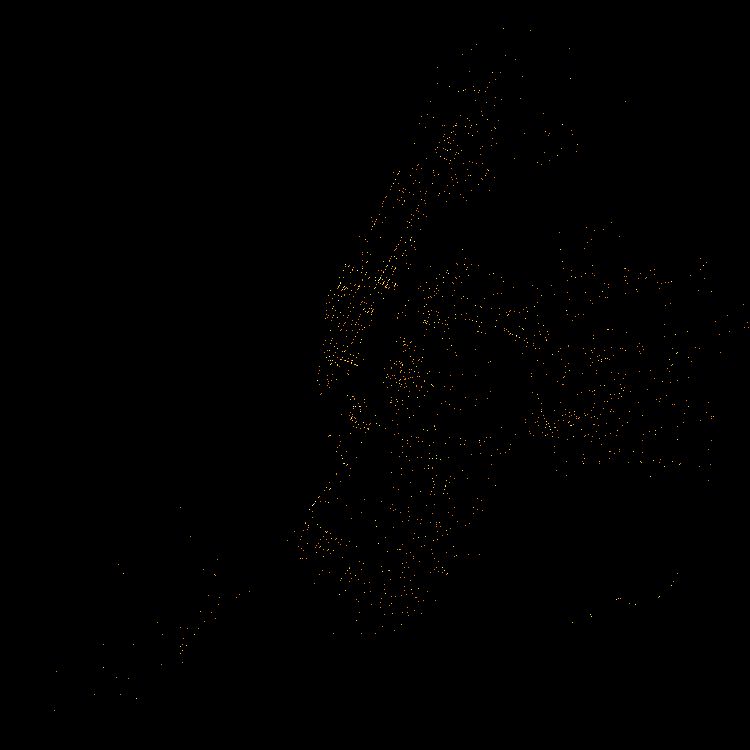

Other Vehicular : 36556 incidents,


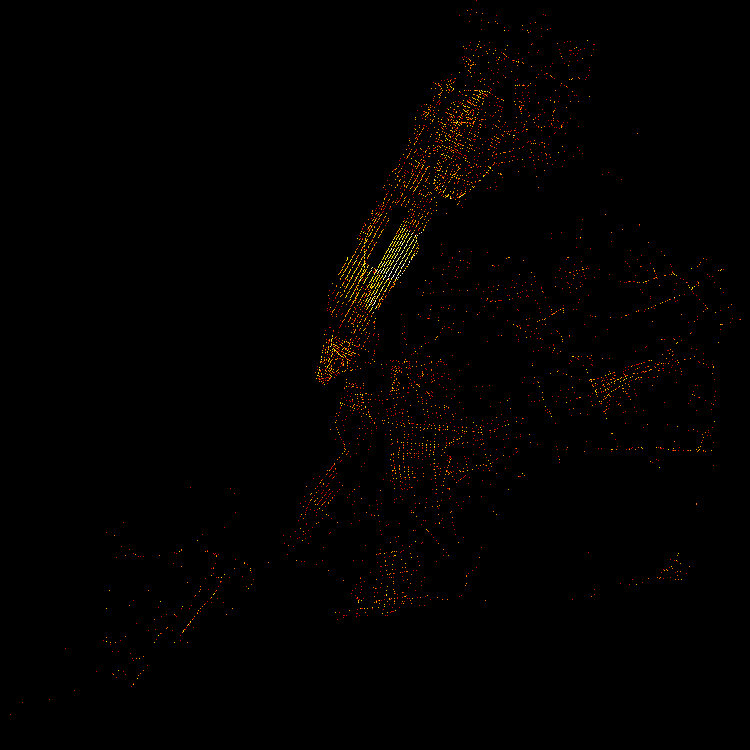

Illness : 2579 incidents,


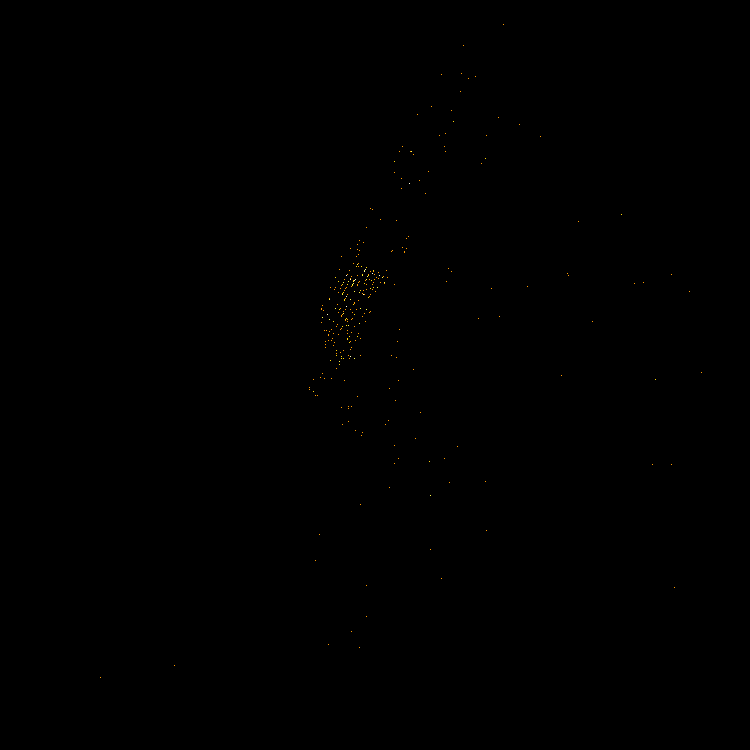

Obstruction/Debris : 1959 incidents,


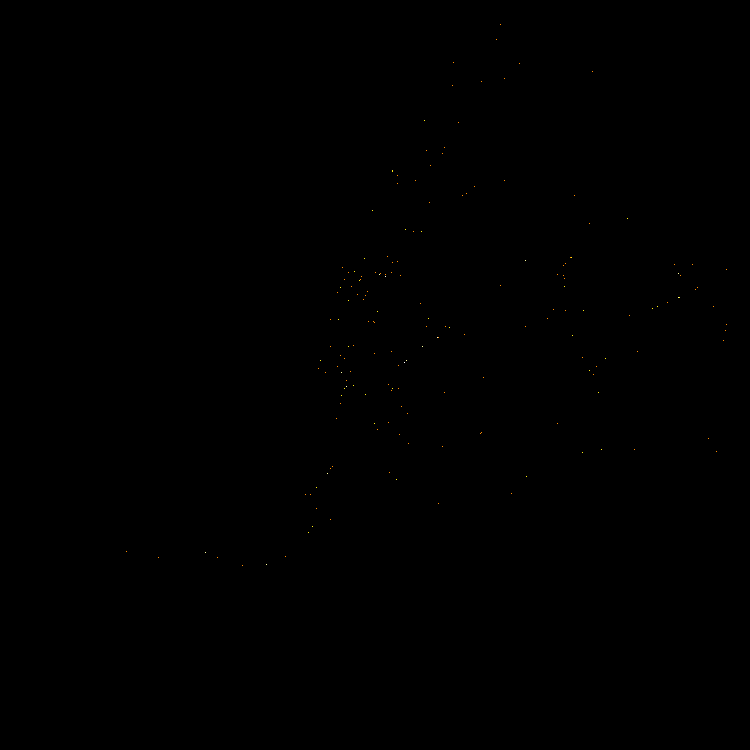

Unsafe Lane Changing : 11244 incidents,


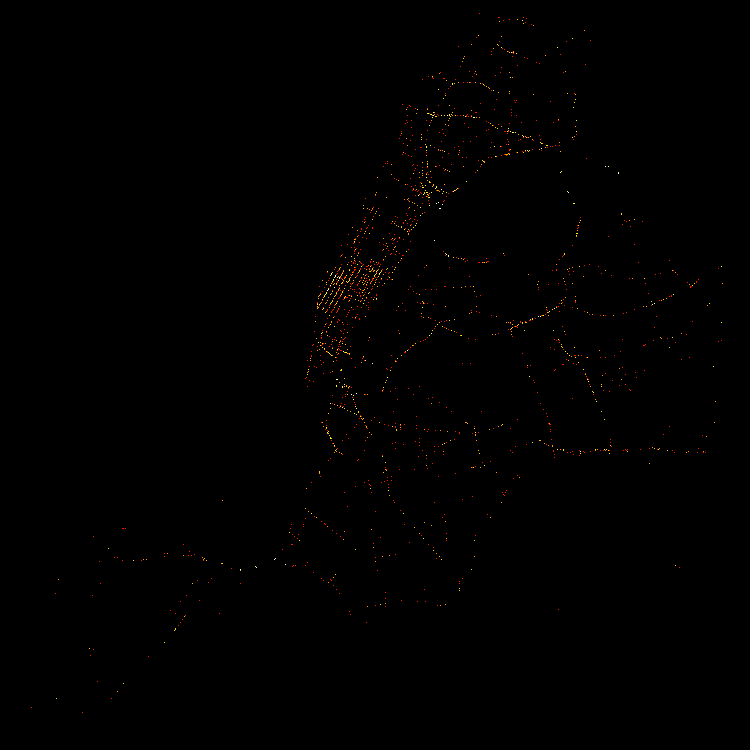

Failure to Keep Right : 2004 incidents,


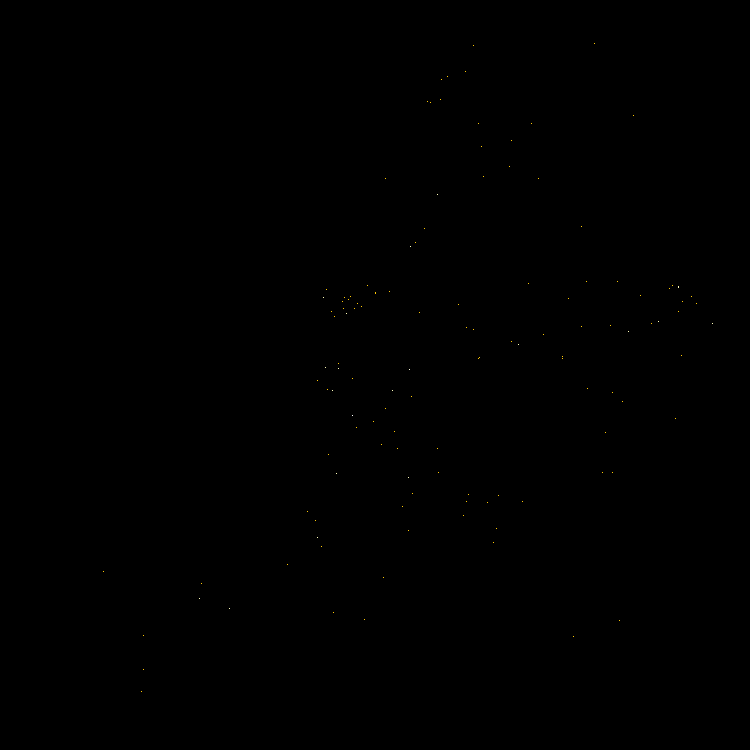

Prescription Medication : 15118 incidents,


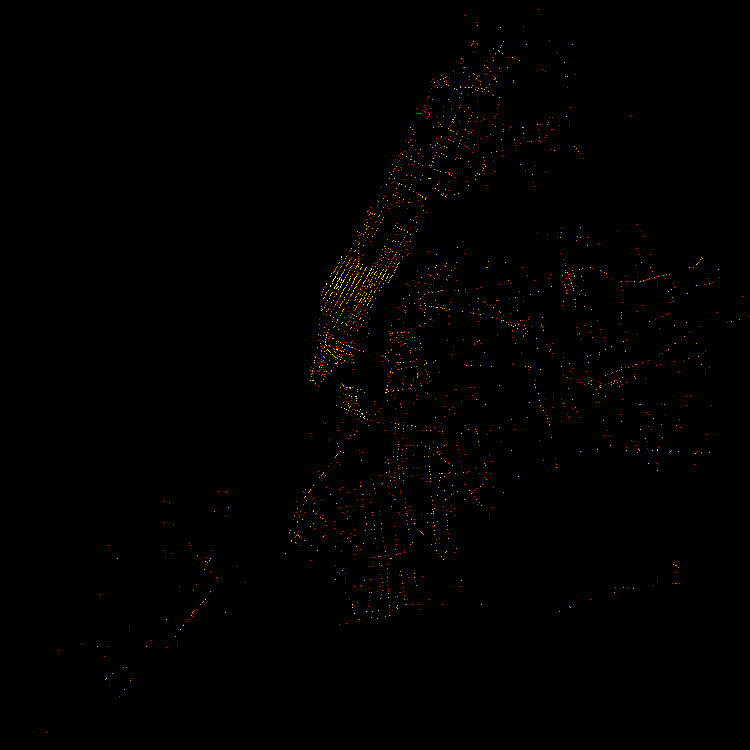

Backing Unsafely : 34557 incidents,


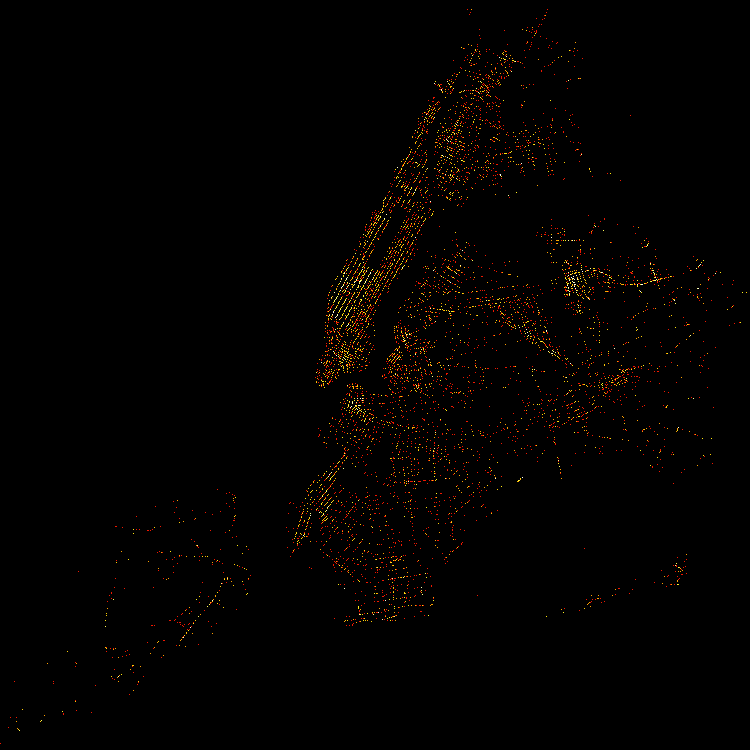

Outside Car Distraction : 9815 incidents,


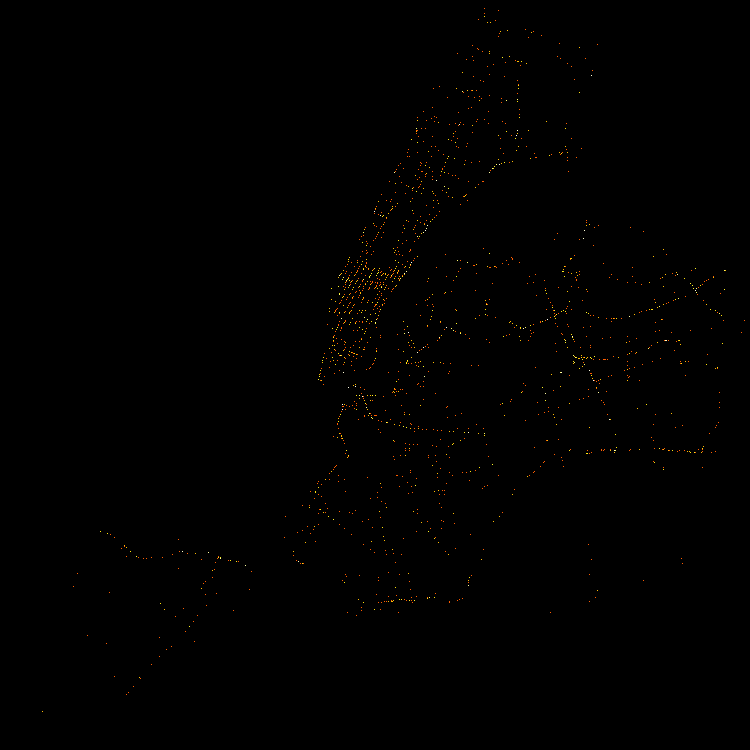

Passing or Lane Usage Improper : 13511 incidents,


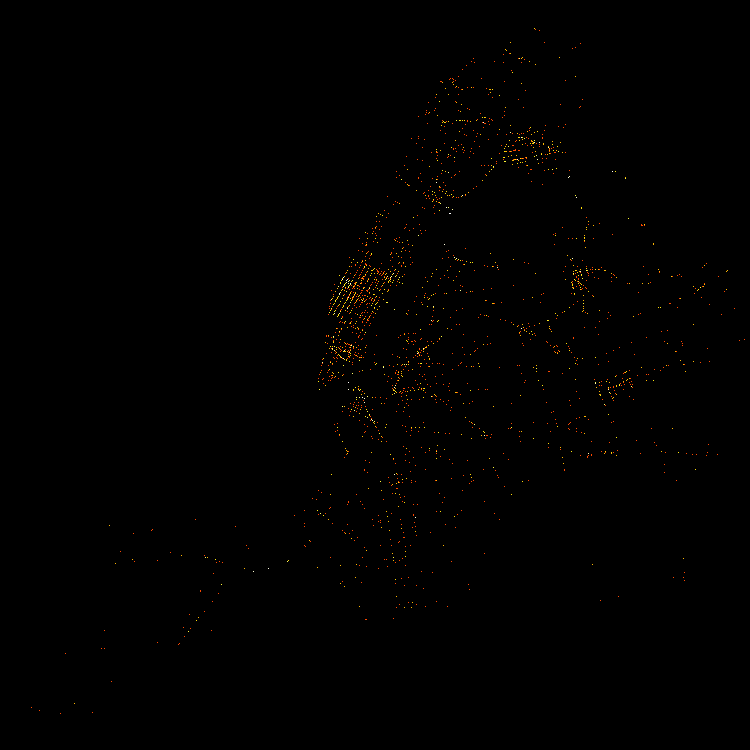

Other Electronic Device : 2169 incidents,


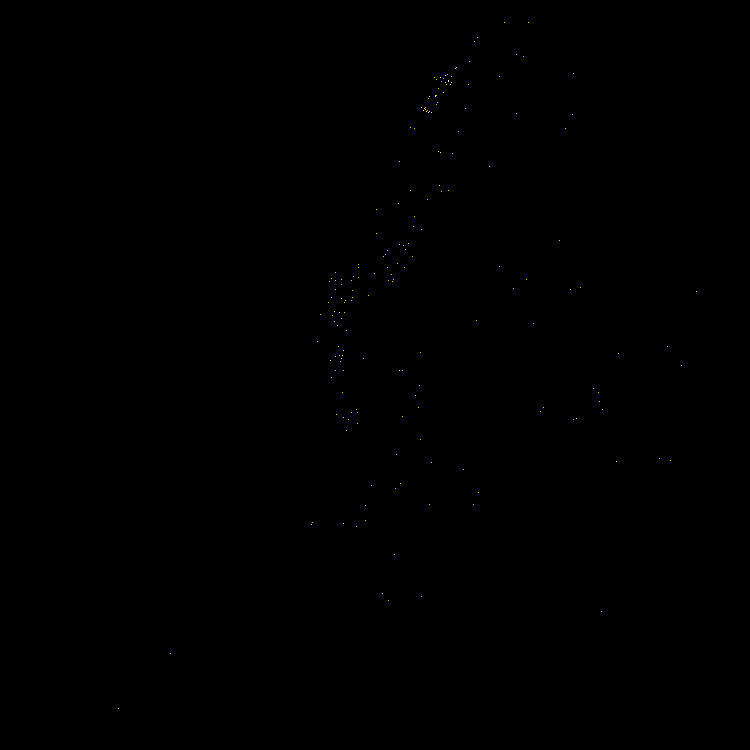

Accelerator Defective : 466 incidents,


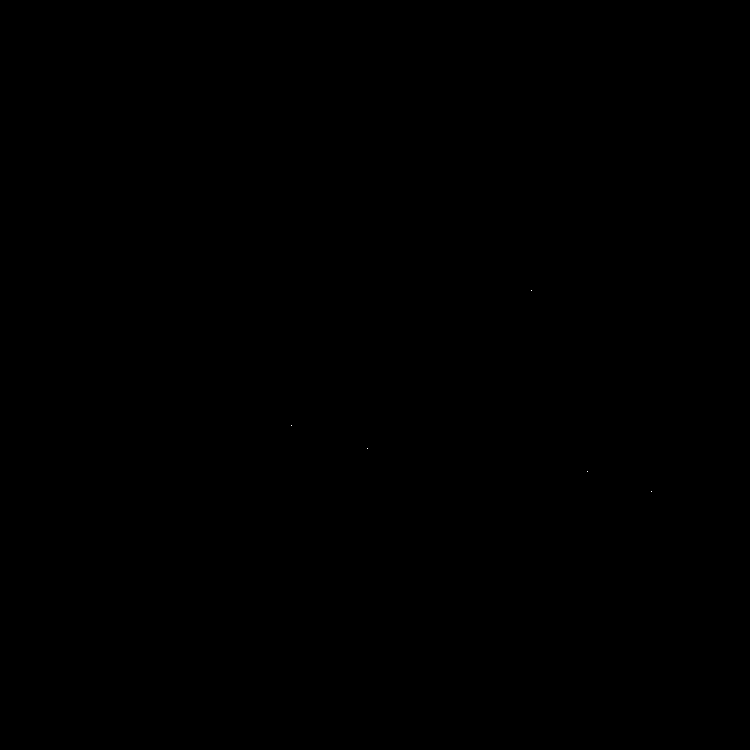

Drugs (Illegal) : 592 incidents,


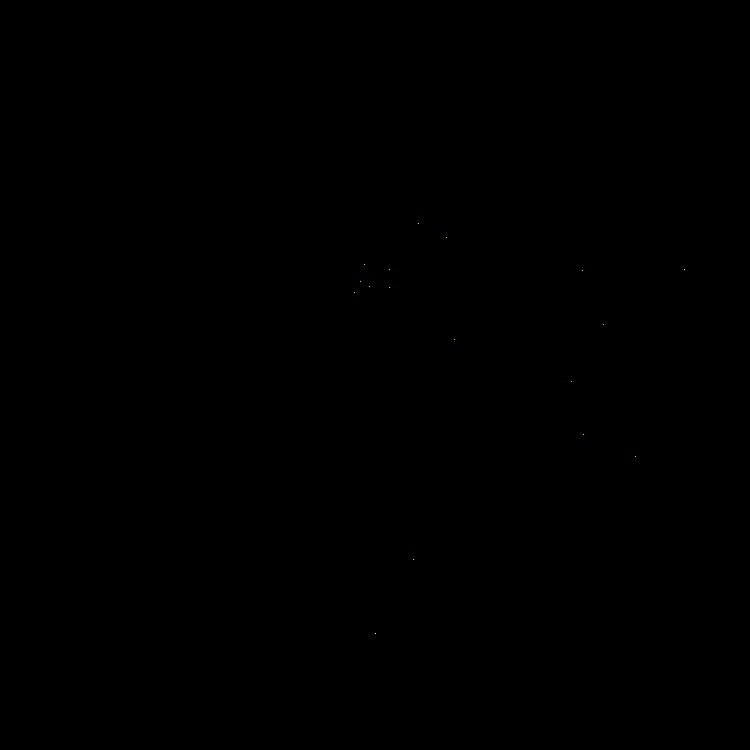

In [10]:
for factor in contributing_factors: 
    factor_df = df_factor(factor)
    print('{} : {} incidents,'.format(factor, len(factor_df)))
    agg = ds.Canvas(750,750).points(factor_df, 'LONGITUDE','LATITUDE')
    display(tf.set_background(tf.shade(agg, cmap=fire),"black"))

### Visualize on map

In [11]:
df.loc[:, 'lon'], df.loc[:, 'lat'] = ds.utils.lnglat_to_meters(df.LONGITUDE,df.LATITUDE)


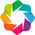

:DynamicMap   []

In [12]:
hv.extension('bokeh')

url = 'https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{z}/{y}/{x}'
tile_opts  = dict(width=1000,height=600,xaxis=None,yaxis=None,bgcolor='black',show_grid=False)
map_tiles  = gv.WMTS(url).opts(style=dict(alpha=0.5), plot=tile_opts)
points     = hv.Points(df, ['lon', 'lat'])
taxi_trips = datashade(points, x_sampling=1, y_sampling=1, cmap=fire, width=1000, height=600)

map_tiles * taxi_trips

### When and where do collisions take place

In [40]:
df['hour'] = pd.to_datetime(df['TIME'], format='%H:%M').dt.hour

In [14]:
NYC = x_range, y_range = ((-8242000,-8210000), (4965000,4990000))

plot_width  = int(750)
plot_height = int(plot_width//1.2)
background = "black"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    return p
    
options = dict(line_color=None, fill_color='blue', size=5)

In [15]:
from bokeh.models import WMTSTileSource

colors = ["#FF0000","#FF3F00","#FF7F00","#FFBF00","#FFFF00","#BFFF00","#7FFF00","#3FFF00",
          "#00FF00","#00FF3F","#00FF7F","#00FFBF","#00FFFF","#00BFFF","#007FFF","#003FFF",
          "#0000FF","#3F00FF","#7F00FF","#BF00FF","#FF00FF","#FF00BF","#FF007F","#FF003F",]

def colorized_images(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'lon', 'lat', ds.count_cat('hour'))
    img = tf.shade(agg, color_key=colors)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
#p.add_tile(WMTSTileSource(url='https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{z}/{y}/{x}'))
export(colorized_images(*NYC),"NYC_collission_times")
InteractiveImage(p, colorized_images)

Here the order of colors is roughly red (midnight), yellow (4am), green (8am), cyan (noon), blue (4pm), purple (8pm), and back to red (since hours and colors are both cyclic).

### Bike vs TAXI collisions
Where do more bike collisions occur(red) than those involving Taxis (blue)?

In [16]:
dftaxi = df_vehicle('TAXI')
dfbike = df_vehicle('BICYCLE')

def merged_images(x_range, y_range, w=plot_width, h=plot_height, how='log'):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    taxi = cvs.points(dftaxi, 'lon', 'lat')
    bike = cvs.points(dfbike, 'lon', 'lat')
    more_drops = tf.shade(taxi.where(taxi > bike), cmap=["darkblue", 'cornflowerblue'], how=how)
    more_picks = tf.shade(bike.where(bike > taxi), cmap=["darkred", 'orangered'],  how=how)
    img = tf.stack(more_picks,more_drops)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
export(merged_images(*NYC),"NYC_bikes_vs_taxis")
InteractiveImage(p, merged_images)

### Visualize with ESRI light gray canvas basemap

In [17]:
basemap = WMTSTileSource(url='https://server.arcgisonline.com/arcgis/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}')

def create_image_df(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(dfx, 'lon', 'lat')
    img = tf.shade(agg.where(agg>np.percentile(agg,90)), cmap=inferno, how='eq_hist')
    return tf.dynspread(img, threshold=0.3, max_px=4)

dfx = dftaxi
p = base_plot()
p.add_tile(basemap)
export(create_image_df(*NYC),"NYC_Collissions")
InteractiveImage(p, create_image_df)

### Hourly trend

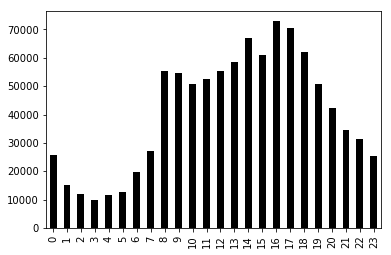

In [87]:
df['hour'].value_counts().sort_index().plot(kind='bar', color='k')

In [23]:
df['DATE'] = pd.to_datetime(df['DATE'])

### Weekly trend by the hour

In [30]:
df['day_week'] = df.DATE.dt.dayofweek

In [90]:
day_week_labels = ['Mon', 'Tues', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_week_hr_labels = [day_week_labels[day] + '-' + str(hour)
                      for day in range(0,7)
                      for hour in range(0,25)]
df['day_week_hour'] = df.day_week*25 + df.hour

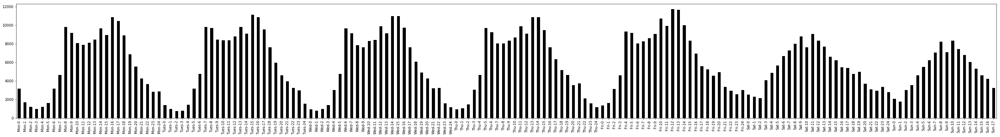

In [91]:
import matplotlib.pyplot as plt
%matplotlib inline 

fig = plt.figure()
fig.set_size_inches(50,6)
fig.add_subplot(111)

ax_day_week_hr = df['day_week_hour'].value_counts().sort_index().plot(kind='bar', color='k')
ax_day_week_hr.set_xticklabels(day_week_hr_labels);

In [92]:
df_alcohol = df_factor('Alcohol Involvement')

### Drunk driving
Alcohol related collisions increase markedly on Friday and Saturday evenings.

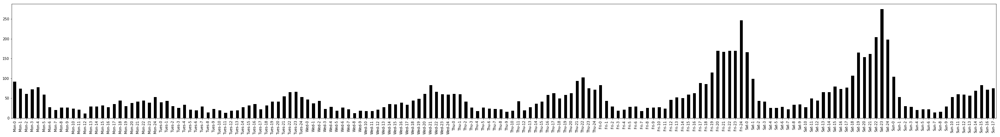

In [93]:
fig = plt.figure()
fig.set_size_inches(50,6)
fig.add_subplot(111)

ax_day_week_hr = df_alcohol['day_week_hour'].value_counts().sort_index().plot(kind='bar', color='k')
ax_day_week_hr.set_xticklabels(day_week_hr_labels);

### Pedestrian injuries 
edestrian injuries peak during early mornings and evenings:

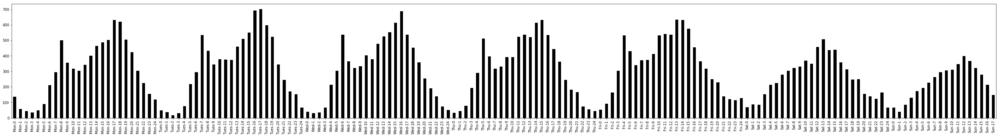

In [94]:
fig = plt.figure()
fig.set_size_inches(50,6)
fig.add_subplot(111)

ax_day_week_hr = df[df['NUMBER OF PEDESTRIANS INJURED']> 0]['day_week_hour'].value_counts().sort_index().plot(kind='bar', color='k')
ax_day_week_hr.set_xticklabels(day_week_hr_labels);

### Calendar Hotspots

In [89]:
df['dayofyear'] = df.DATE.dt.dayofyear

In [117]:
df['year'] = df.DATE.dt.year

In [118]:
df['month'] = df.DATE.dt.month

In [119]:
df['day'] = df.DATE.dt.day

In [122]:
df.to_pickle('df.pkl')

In [167]:
dftime = df.set_index('DATE')

In [168]:
import calmap

In [180]:
dftime['incident']= 1

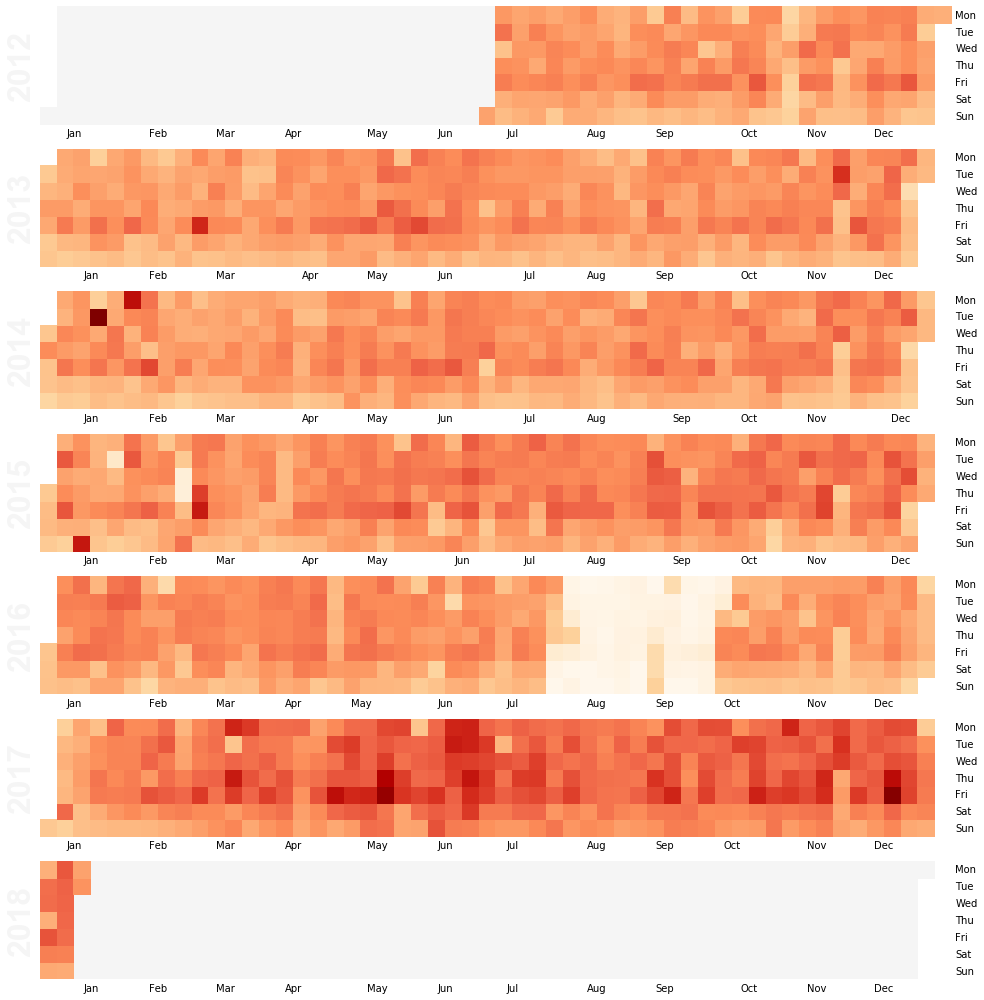

In [184]:
calmap.calendarplot(dftime['incident'], linewidth=0, cmap='OrRd', fig_kws=dict(figsize=(18, 14)));

In [144]:
df_alcohol = df_factor('Alcohol Involvement')

In [185]:
df_alcohol['incident'] = 1

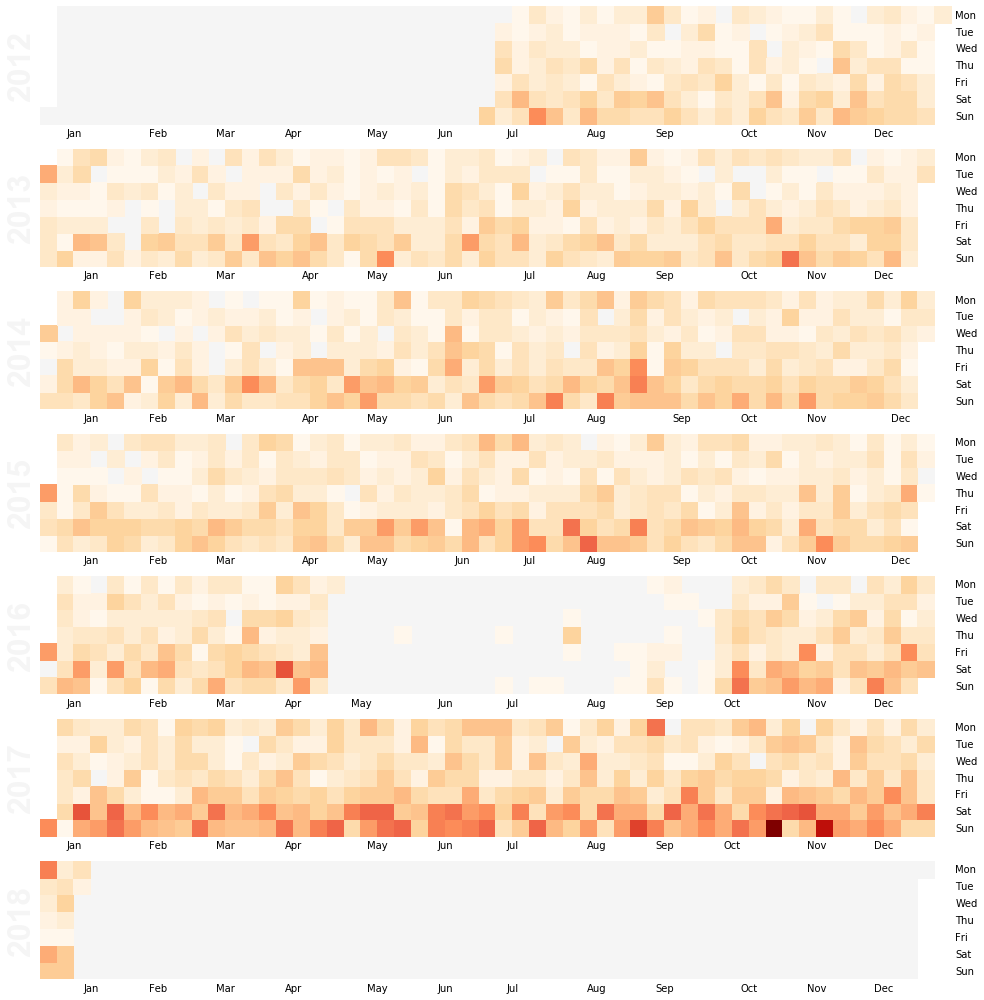

In [188]:
calmap.calendarplot(df_alcohol.set_index('DATE')['incident'], linewidth=0, cmap='OrRd', fig_kws=dict(figsize=(18, 14)));

As is evident from the calendar hotspots above, accidents tend to go down during the weekends in general, but those involving drunk driving increase during the weekends. Additionally, there are hotspots on certain days of the year, such as New Years day, Memorial day. Independence day. Labor day, Thanksgiving, and Christmas eve. We also see missing / mislabeled data for several months in 2016 and so it cannot be included as part of our predictive model.